##Download dataset

This cell uses kagglehub to fetch the Breast Histopathology Images dataset and prints the local path where it was saved. We’ll use that path to load images later.

In [ ]:
import kagglehub
import os
import shutil

# Download dataset
path = kagglehub.dataset_download("paultimothymooney/breast-histopathology-images")
print("Path to cached dataset files:", path)

# Define new destination inside /kaggle/working
dest = "/kaggle/working/breast-histopathology-images"

# Copy dataset if not already copied
if not os.path.exists(dest):
    shutil.copytree(path, dest)

print("Dataset is now available at:", dest)

100%|██████████| 3.10G/3.10G [00:28<00:00, 116MB/s]

Extracting files...


Path to cached dataset files: /root/.cache/kagglehub/datasets/paultimothymooney/breast-histopathology-images/versions/1
Dataset is now available at: /kaggle/working/breast-histopathology-images


 Core libraries for data handling, plotting, image I/O, deep learning (PyTorch + TorchVision), and some scikit-learn utilities for splits and class weights.

In [ ]:
# --- Standard library ---
import os
import time
import copy
import warnings
from glob import glob
from os import listdir

# --- Suppress common warnings ---
warnings.filterwarnings("ignore", category=DeprecationWarning)
warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

# --- Data handling & utilities ---
import numpy as np
import pandas as pd

# --- Visualization ---
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
sns.set()
from PIL import Image
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score


# --- PyTorch & TorchVision ---
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.optim.lr_scheduler import ReduceLROnPlateau, StepLR, CyclicLR
import torchvision
from torchvision import datasets, models, transforms
from torch.utils.data import Dataset, DataLoader

# --- Scikit-learn utilities ---
from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.utils.class_weight import compute_class_weight

# --- Image I/O ---
from skimage.io import imread

# --- Progress bar ---
from tqdm import tqdm_notebook as tqdm

* tqdm_notebook adds progress bars during training.
* StratifiedKFold and compute_class_weight help handle class imbalance.

##Training switches

These flags let you toggle longer steps while you’re experimenting. Keep them False for quick exploration; switch to True when you’re ready to train.

In [ ]:
run_training = True
retrain = False
find_learning_rate = True

* run_training: actually run the training loop.
* retrain: reinitialize and train from scratch.
* find_learning_rate: run an LR finder before training.

## Top-level folder listing

Quick check of the dataset root to understand the structure and confirm it’s accessible.

In [ ]:
# Use the path returned by the download step
files = os.listdir(path)
print(len(files))   # number of top-level folders
print(files[:10])   # show first few entries

280
['8864', '10300', '12882', '15513', '10307', '12242', '10268', '9174', '9291', '9382']


**What you should see**: patient-level folders or named subdirectories that hold the patches.

##Patient folders inside the dataset

We point base_path to the dataset and count how many patient folders exist. Each patient folder contains multiple 50×50 image patches.

In [ ]:
base_path = path # Use the path returned by the download step
patients = os.listdir(base_path)
print("Number of patient folders:", len(patients))

Number of patient folders: 280


**Why this matters**: there are many patches but fewer patients, so we should split data by patient, not by random patches, to avoid leakage and overfitting.

In [ ]:
files = os.listdir(path) # Use the path returned by the download step
len(files)

280

##Calculating Patch Statistics

Count the total number of image patches across all patients and classes, and break down the distribution between IDC (cancer) and non-IDC (healthy).

In [ ]:
base_path = path # Use the path returned by the download step
patients = os.listdir(base_path)

total_images = 0
class_counts = {0: 0, 1: 0}

for patient_id in patients:
    patient_path = os.path.join(base_path, patient_id)
    # loop over class folders 0 and 1
    for c in [0, 1]:
        class_path = os.path.join(patient_path, str(c))
        if os.path.exists(class_path):  # some patients may not have both classes
            subfiles = os.listdir(class_path)
            total_images += len(subfiles)
            class_counts[c] += len(subfiles)

print("Total image patches:", total_images)
print("Class 0 patches:", class_counts[0])
print("Class 1 patches:", class_counts[1])

Total image patches: 277524
Class 0 patches: 198738
Class 1 patches: 78786


## Creating a Master Dataframe of Patches


Store patient ID, file path, and target labels for each patch into a pandas DataFrame, which will serve as the central dataset reference.

In [ ]:
data = pd.DataFrame(index=np.arange(total_images),
                        columns=["patient_id", "path", "target"])

row_idx = 0
for pid in patients:   # renamed from folder
    pid_dir = os.path.join(base_path, pid)
    for cls in [0, 1]:
        cls_dir = os.path.join(pid_dir, str(cls))
        if not os.path.isdir(cls_dir):
            continue
        for _, fname in enumerate(os.listdir(cls_dir)):
            img_path = os.path.join(cls_dir, fname)
            data.loc[row_idx] = [pid, img_path, cls]
            row_idx += 1

data.head()

,patient_id,path,target
0,8864,/root/.cache/kagglehub/datasets/paultimothymoo...,0
1,8864,/root/.cache/kagglehub/datasets/paultimothymoo...,0
2,8864,/root/.cache/kagglehub/datasets/paultimothymoo...,0
3,8864,/root/.cache/kagglehub/datasets/paultimothymoo...,0
4,8864,/root/.cache/kagglehub/datasets/paultimothymoo...,0


## Exploratory Data Analysis on Patch Distribution

Visualize the number of patches per patient, the percentage of IDC coverage, and the global balance between positive and negative classes.

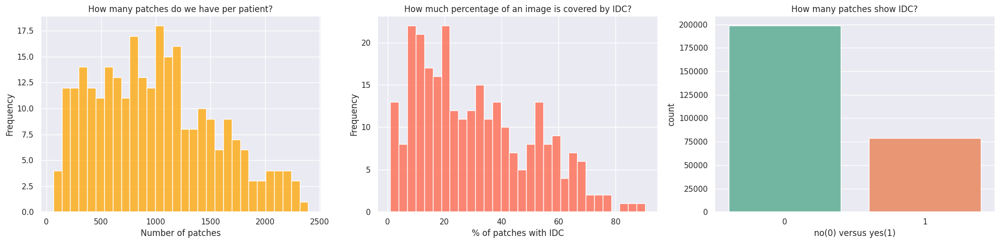

In [ ]:
cancer_perc = data.groupby("patient_id").target.value_counts() / data.groupby("patient_id").target.size()
cancer_perc = cancer_perc.unstack()

fig, ax = plt.subplots(1, 3, figsize=(20, 5))

# Number of patches per patient
sns.histplot(data.groupby("patient_id").size(), bins=30, color="Orange", ax=ax[0])
ax[0].set_xlabel("Number of patches")
ax[0].set_ylabel("Frequency")
ax[0].set_title("How many patches do we have per patient?")

# Percentage of patches with IDC
sns.histplot(cancer_perc.loc[:, 1]*100, bins=30, color="Tomato", ax=ax[1])
ax[1].set_xlabel("% of patches with IDC")
ax[1].set_ylabel("Frequency")
ax[1].set_title("How much percentage of an image is covered by IDC?")

# Count of IDC vs non-IDC patches
sns.countplot(x="target", data=data, palette="Set2", ax=ax[2])
ax[2].set_xlabel("no(0) versus yes(1)")
ax[2].set_title("How many patches show IDC?")

plt.tight_layout()
plt.show()

## Visualizing Cancerous Patches (IDC Positive) & Healthy Patches (IDC Negative)

In [ ]:
data.target = data.target.astype(int)

pos_selection = np.random.choice(data.loc[data.target == 1].index, size=50, replace=False)
neg_selection = np.random.choice(data.loc[data.target == 0].index, size=50, replace=False)

### Visualizing Cancerous Patches (IDC Positive)

Randomly sample IDC-positive patches from the dataset and display them to visually inspect cancerous tissue regions.

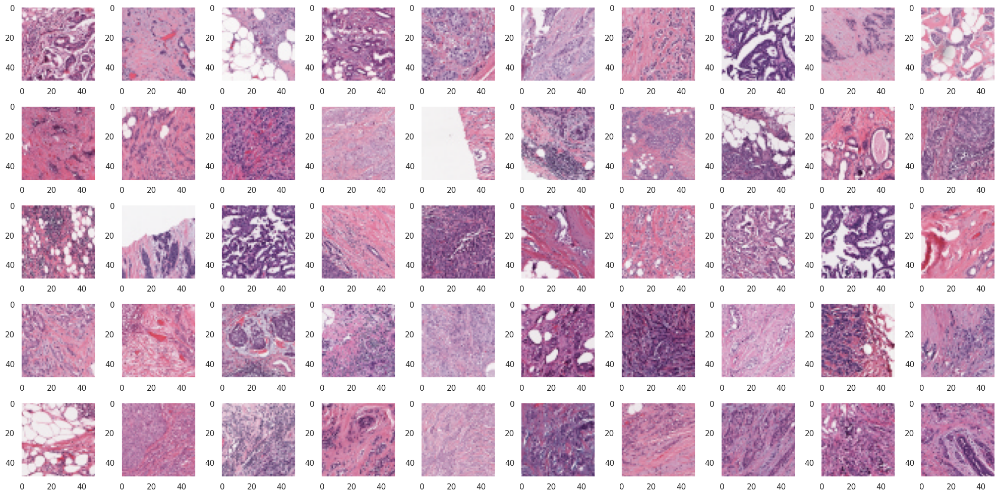

In [ ]:
fig, ax = plt.subplots(5, 10, figsize=(20, 10))

for n in range(5):
    for m in range(10):
        idx = pos_selection[m + 10 * n]
        image = imread(data.loc[idx, "path"])
        ax[n, m].imshow(image)
        ax[n, m].grid(False)

plt.tight_layout()
plt.show()

### Visualizing Healthy Patches (IDC Negative)

Randomly sample IDC-negative patches from the dataset and display them to visually compare with healthy tissue regions.

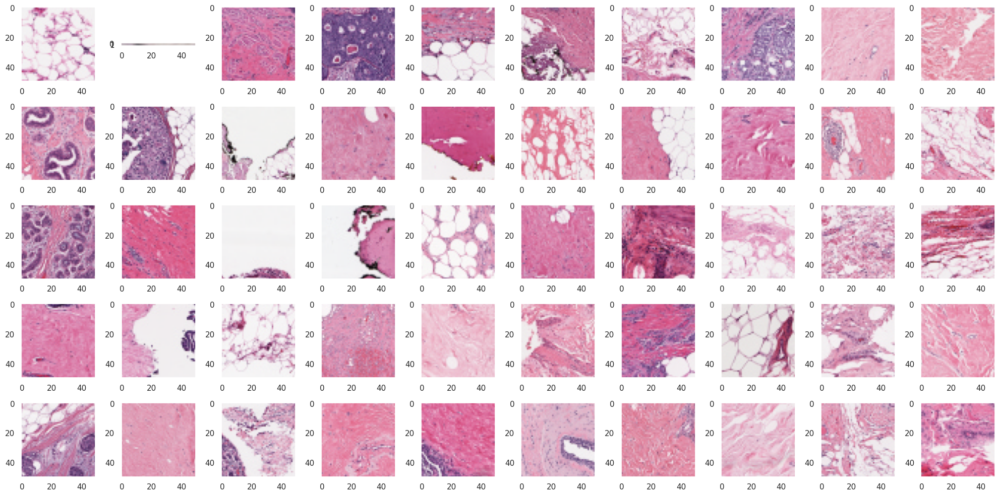

In [ ]:
fig, ax = plt.subplots(5, 10, figsize=(20, 10))

for n in range(5):
    for m in range(10):
        idx = neg_selection[m + 10 * n]
        image = imread(data.loc[idx, "path"])
        ax[n, m].imshow(image)
        ax[n, m].grid(False)

plt.tight_layout()
plt.show()

## Extracting Patch Coordinates from Filenames


Parse x and y coordinates encoded in filenames to enable reconstruction of tissue slices from individual patches.

In [ ]:
def extract_coords(df):
    coord = df.path.str.rsplit("_", n=4, expand=True)
    coord = coord.drop([0, 1, 4], axis=1)
    coord = coord.rename({2: "x", 3: "y"}, axis=1)
    coord["x"] = coord["x"].str.replace("x", "", case=False).astype(int)
    coord["y"] = coord["y"].str.replace("y", "", case=False).astype(int)
    df["x"] = coord.x.values
    df["y"] = coord.y.values
    return df

def get_cancer_dataframe(patient_id, cancer_id):
    path = os.path.join(base_path, patient_id, cancer_id)
    files = listdir(path)
    dataframe = pd.DataFrame(files, columns=["filename"])
    dataframe["path"] = [os.path.join(path, f) for f in dataframe.filename.values]
    dataframe["target"] = int(cancer_id)

    coords = dataframe.filename.str.rsplit("_", n=4, expand=True)
    coords = coords.drop([0, 1, 4], axis=1)
    coords = coords.rename({2: "x", 3: "y"}, axis=1)
    coords["x"] = coords["x"].str.replace("x", "", case=False).astype(int)
    coords["y"] = coords["y"].str.replace("y", "", case=False).astype(int)

    dataframe["x"] = coords.x.values
    dataframe["y"] = coords.y.values

    return dataframe

def get_patient_dataframe(patient_id):
    df_0 = get_cancer_dataframe(patient_id, "0")
    df_1 = get_cancer_dataframe(patient_id, "1")
    patient_df = pd.concat([df_0, df_1], ignore_index=True)
    return patient_df

In [ ]:
# Get the dataframe for the first patient
example = get_patient_dataframe(data.patient_id.values[0])
example.head()

,filename,path,target,x,y
0,8864_idx5_x2451_y501_class0.png,/root/.cache/kagglehub/datasets/paultimothymoo...,0,2451,501
1,8864_idx5_x851_y1801_class0.png,/root/.cache/kagglehub/datasets/paultimothymoo...,0,851,1801
2,8864_idx5_x1751_y2001_class0.png,/root/.cache/kagglehub/datasets/paultimothymoo...,0,1751,2001
3,8864_idx5_x2801_y2701_class0.png,/root/.cache/kagglehub/datasets/paultimothymoo...,0,2801,2701
4,8864_idx5_x1351_y1801_class0.png,/root/.cache/kagglehub/datasets/paultimothymoo...,0,1351,1801


## Scatter Plot Visualization of Tissue Layout

Plot patch positions on tissue slices, color-coded by class label (IDC or non-IDC), to visualize how cancer regions are spatially distributed.


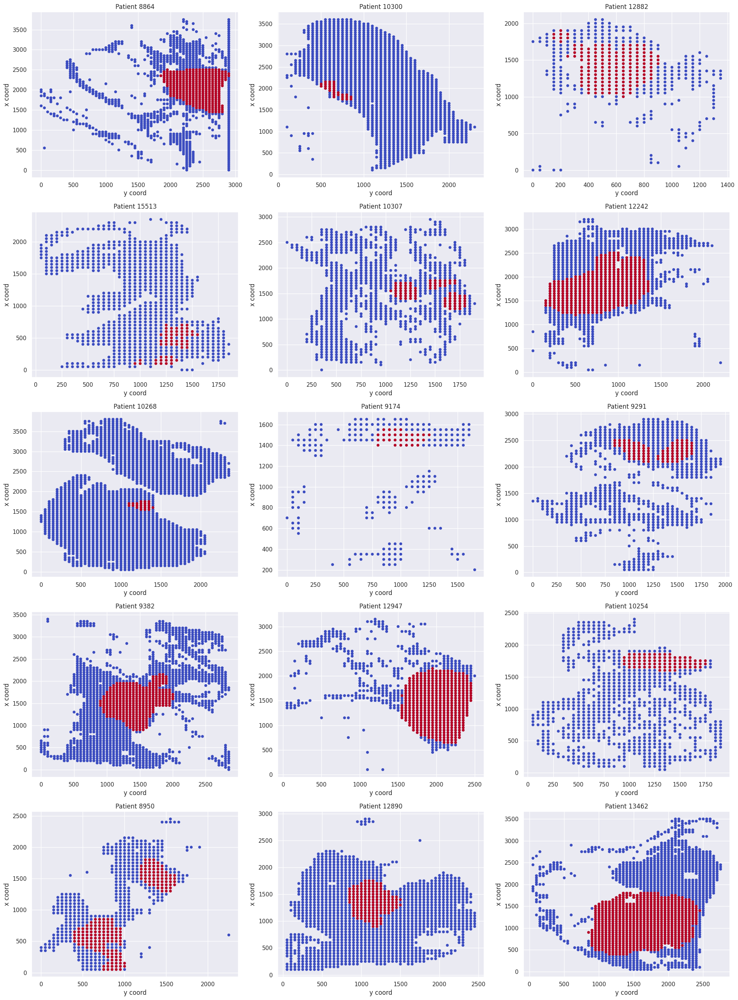

In [ ]:
fig, ax = plt.subplots(5, 3, figsize=(20, 27))

patient_ids = data.patient_id.unique()

for n in range(5):
    for m in range(3):
        patient_id = patient_ids[m + 3 * n]
        example_df = get_patient_dataframe(patient_id)

        ax[n, m].scatter(
            example_df.y.values,  # x-axis = y coord
            example_df.x.values,  # y-axis = x coord
            c=example_df.target.values,
            cmap="coolwarm",
            s=20
        )
        ax[n, m].set_title(f"Patient {patient_id}")
        ax[n, m].set_xlabel("y coord")
        ax[n, m].set_ylabel("x coord")

plt.tight_layout()
plt.show()

## Reconstructing Tissue Slices with IDC Overlay

Reassemble full patient tissue slices by stitching patches together and highlight IDC-positive patches with a red overlay for clarity.

In [ ]:
def visualise_breast_tissue(patient_id, pred_df=None):
    example_df = get_patient_dataframe(patient_id)
    max_point = [example_df.y.max() - 1, example_df.x.max() - 1]

    grid = 255 * np.ones((max_point[0] + 50, max_point[1] + 50, 3), dtype=np.uint8)
    mask = 255 * np.ones((max_point[0] + 50, max_point[1] + 50, 3), dtype=np.uint8)

    mask_proba = np.zeros((max_point[0] + 50, max_point[1] + 50, 1), dtype=float)

    if pred_df is not None:
        patient_df = pred_df[pred_df.patient_id == patient_id].copy()

    broken_patches = []

    for n in range(len(example_df)):
        try:
            image = imread(example_df.path.values[n])
            target = example_df.target.values[n]

            x_coord = int(example_df.x.values[n])
            y_coord = int(example_df.y.values[n])
            x_start, y_start = x_coord - 1, y_coord - 1
            x_end, y_end = x_start + 50, y_start + 50

            grid[y_start:y_end, x_start:x_end] = image

            if target == 1:
                mask[y_start:y_end, x_start:x_end] = [250, 0, 0]  # red overlay for cancer

            if pred_df is not None:
                proba = patient_df[
                    (patient_df.x == x_coord) & (patient_df.y == y_coord)
                ].proba
                if not proba.empty:
                    mask_proba[y_start:y_end, x_start:x_end, 0] = float(proba.values[0])

        except ValueError:
            broken_patches.append(example_df.path.values[n])

    return grid, mask, broken_patches, mask_proba

Text(0.5, 1.0, 'Cancer tissue colored red \n of patient: 13616')

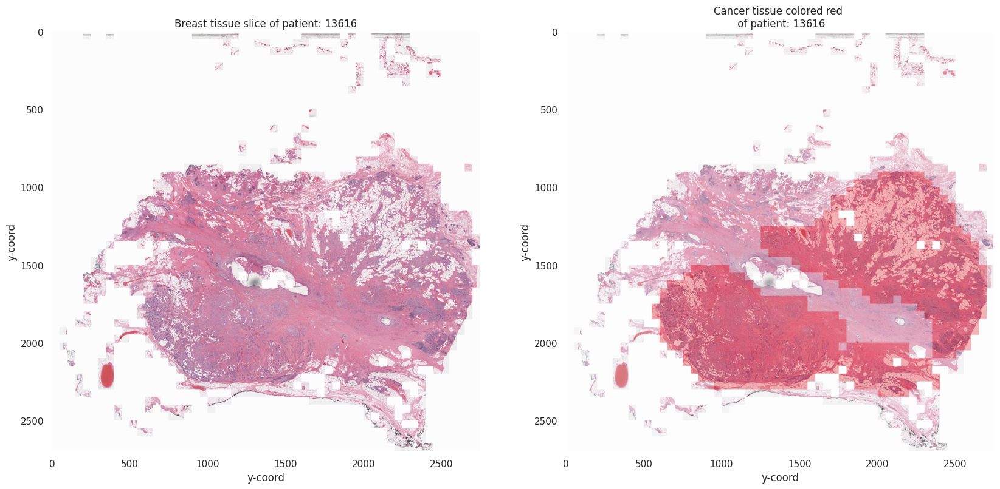

In [ ]:
example = "13616"
grid, mask, broken_patches, _ = visualise_breast_tissue(example)

fig, ax = plt.subplots(1, 2, figsize=(20, 10))

ax[0].imshow(grid, alpha=0.9)
ax[1].imshow(mask, alpha=0.8)
ax[1].imshow(grid, alpha=0.7)

ax[0].grid(False)
ax[1].grid(False)

for m in range(2):
    ax[m].set_xlabel("y-coord")
    ax[m].set_ylabel("y-coord")

ax[0].set_title("Breast tissue slice of patient: " + example)
ax[1].set_title("Cancer tissue colored red \n of patient: " + example)

##  Defining the Machine Learning Workflow Parameters

Set constants for batch size, number of classes, paths for saving models, random seeds, and other global experiment parameters.

In [ ]:
BATCH_SIZE = 32
NUM_CLASSES = 2

OUTPUT_PATH = ""
MODEL_PATH = "/kaggle/working/breastcancer_model.pth"
LOSSES_PATH = "/kaggle/working/losses_breastcancer.csv"

In [ ]:
torch.manual_seed(0)
np.random.seed(0)

In [ ]:
data.head()
data.loc[:, "target"] = data.target.astype(str)
data.info()

<class 'pandas.core.frame.DataFrame'>
Index: 277524 entries, 0 to 277523
Data columns (total 3 columns):
 #   Column      Non-Null Count   Dtype 
---  ------      --------------   ----- 
 0   patient_id  277524 non-null  object
 1   path        277524 non-null  object
 2   target      277524 non-null  object
dtypes: object(3)
memory usage: 16.5+ MB


## Splitting Data into Train, Development, and Test Sets

Split patients into training (~70%), validation (~15%), and test (~15%) groups to evaluate performance fairly.

In [ ]:
patients = data.patient_id.unique()

train_ids, sub_test_ids = train_test_split(
    patients,
    test_size=0.3,
    random_state=0
)

test_ids, dev_ids = train_test_split(
    sub_test_ids,
    test_size=0.5,
    random_state=0
)

In [ ]:
print(
    len(train_ids) / patients.shape[0] * 100,
    len(dev_ids) / patients.shape[0] * 100,
    len(test_ids) / patients.shape[0] * 100
)

69.89247311827957 15.053763440860216 15.053763440860216


Splitting complete — 70% training, 15% validation, and 15% testing data

In [ ]:
print(len(train_ids), len(dev_ids), len(test_ids))

195 42 42


In [ ]:
train_df = data.loc[data.patient_id.isin(train_ids),:].copy()
test_df = data.loc[data.patient_id.isin(test_ids),:].copy()
dev_df = data.loc[data.patient_id.isin(dev_ids),:].copy()

train_df = extract_coords(train_df)
test_df = extract_coords(test_df)
dev_df = extract_coords(dev_df)

## Checking Target Distributions Across Splits

Plot class distribution within the training, validation, and test sets to confirm balance and avoid biased learning.

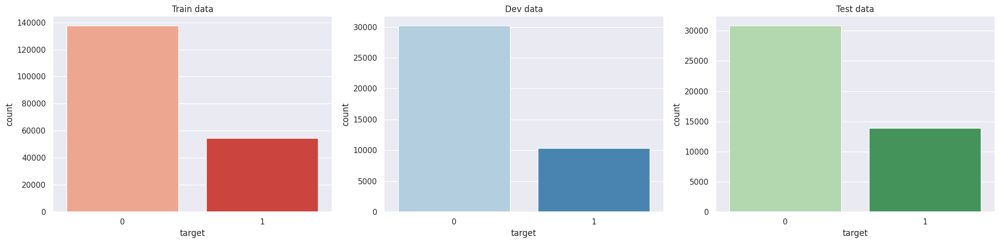

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(20, 5))

sns.countplot(x=train_df.target, ax=ax[0], palette="Reds")
ax[0].set_title("Train data")

sns.countplot(x=dev_df.target, ax=ax[1], palette="Blues")
ax[1].set_title("Dev data")

sns.countplot(x=test_df.target, ax=ax[2], palette="Greens")
ax[2].set_title("Test data")

plt.tight_layout()
plt.show()

## Defining Image Augmentation and Normalization Transforms

Specify TorchVision transforms for training and validation sets, including resizing, flipping, and normalization for ResNet compatibility.

In [ ]:
def my_transform(key="train", plot=False):
    train_sequence = [
        transforms.Resize((50, 50)),
        transforms.RandomHorizontalFlip(),
        transforms.RandomVerticalFlip()
    ]
    val_sequence = [
        transforms.Resize((50, 50))
    ]

    if not plot:
        normalize = transforms.Normalize([0.485, 0.456, 0.406],
                                         [0.229, 0.224, 0.225])
        train_sequence.extend([
            transforms.ToTensor(),
            normalize
        ])
        val_sequence.extend([
            transforms.ToTensor(),
            normalize
        ])

    data_transforms = {
        'train': transforms.Compose(train_sequence),
        'val': transforms.Compose(val_sequence)
    }
    return data_transforms[key]

## Creating Custom Dataset and Dataloader Classes

Build PyTorch Dataset and DataLoader objects for training, validation, and testing pipelines. Verify sample loading visually.

In [ ]:
class BreastCancerDataset(Dataset):

    def __init__(self, df, transform=None):
        self.states = df
        self.transform = transform

    def __len__(self):
        return len(self.states)

    def __getitem__(self, idx):
        patient_id = self.states.patient_id.values[idx]
        x_coord = self.states.x.values[idx]
        y_coord = self.states.y.values[idx]
        image_path = self.states.path.values[idx]

        image = Image.open(image_path).convert('RGB')

        if self.transform:
            image = self.transform(image)

        target = int(self.states.target.values[idx]) if "target" in self.states.columns else None

        return {
            "image": image,
            "label": target,
            "patient_id": patient_id,
            "x": x_coord,
            "y": y_coord
        }

In [ ]:
train_dataset = BreastCancerDataset(
    train_df,
    transform=my_transform(key="train")
)

dev_dataset = BreastCancerDataset(
    dev_df,
    transform=my_transform(key="val")
)

test_dataset = BreastCancerDataset(
    test_df,
    transform=my_transform(key="val")
)

In [ ]:
image_datasets = {"train": train_dataset, "dev": dev_dataset, "test": test_dataset}
dataset_sizes = {x: len(image_datasets[x]) for x in ["train", "dev", "test"]}

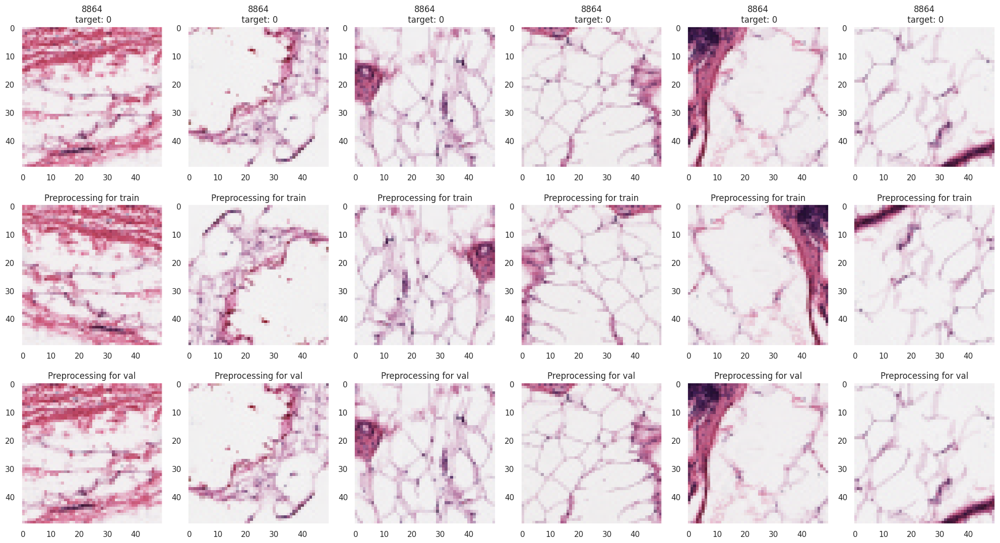

In [ ]:
fig, ax = plt.subplots(3, 6, figsize=(20, 11))

train_transform = my_transform(key="train", plot=True)
val_transform = my_transform(key="val", plot=True)

for m in range(6):
    filepath = train_df.path.values[m]
    image = Image.open(filepath)

    ax[0, m].imshow(image)
    transformed_img = train_transform(image)
    ax[1, m].imshow(transformed_img)
    ax[2, m].imshow(val_transform(image))

    for i in range(3):
        ax[i, m].grid(False)

    ax[0, m].set_title(f"{train_df.patient_id.values[m]}\n target: {train_df.target.values[m]}")
    ax[1, m].set_title("Preprocessing for train")
    ax[2, m].set_title("Preprocessing for val")

plt.tight_layout()
plt.show()

## Creating PyTorch DataLoaders


We create data loaders for the training, validation (dev), and test sets to efficiently batch and shuffle images during training. This setup ensures faster I/O performance and balanced batch generation across epochs.

In [ ]:
train_dataloader = DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    drop_last=True
)

dev_dataloader = DataLoader(
    dev_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    drop_last=True
)

test_dataloader = DataLoader(
    test_dataset,
    batch_size=BATCH_SIZE,
    shuffle=False,
    drop_last=False
)

In [ ]:
dataloaders = {
    "train": train_dataloader,
    "dev": dev_dataloader,
    "test": test_dataloader
}

In [ ]:
print(
    len(dataloaders["train"]),
    len(dataloaders["dev"]),
    len(dataloaders["test"])
)

6005 1267 1400


In [ ]:
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")
device

device(type='cuda', index=0)

## Defining and Modifying the ResNet18 Model

Load a pretrained ResNet18 model, replace the fully connected head with custom layers, and set it up for binary classification.

In [ ]:
# Set device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Number of classes
NUM_CLASSES = 10  # replace with your actual number of classes

# Path in /kaggle/working
MODEL_PATH = "/kaggle/working/resnet18.pth"

# Load pretrained ResNet18
model = models.resnet18(pretrained=True)  # use pretrained=True to avoid external file

# Modify the classifier
NUM_CLASSES = 2  # binary classification

num_features = model.fc.in_features
model.fc = nn.Sequential(
    nn.Linear(num_features, 512),
    nn.ReLU(),
    nn.BatchNorm1d(512),
    nn.Dropout(0.5),
    nn.Linear(512, 256),
    nn.ReLU(),
    nn.BatchNorm1d(256),
    nn.Dropout(0.5),
    nn.Linear(256, NUM_CLASSES)  # now 2 outputs
)

# Initialize weights
def init_weights(m):
    if isinstance(m, nn.Linear):
        nn.init.xavier_uniform_(m.weight)
        m.bias.data.fill_(0.01)

model.apply(init_weights)
model = model.to(device)

# Save the model in /kaggle/working
torch.save(model.state_dict(), MODEL_PATH)
print(f"Model saved at {MODEL_PATH}")

# To load later:
# model.load_state_dict(torch.load(MODEL_PATH))

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth


100%|██████████| 44.7M/44.7M [00:00<00:00, 84.8MB/s]


Model saved at /kaggle/working/resnet18.pth


## Creating Custom Dataset and Dataloader Classes

Compute class weights using scikit-learn and define a weighted CrossEntropyLoss to address imbalanced dataset issues.

In [ ]:
weights = compute_class_weight(
    y=train_df.target.values,
    class_weight="balanced",
    classes=train_df.target.unique()
)

class_weights = torch.FloatTensor(weights)

if device.type == "cuda":
    class_weights = class_weights.cuda()

print(class_weights)

tensor([0.6980, 1.7627], device='cuda:0')


In [ ]:
train_df.target.unique()

array(['0', '1'], dtype=object)

In [ ]:
criterion = nn.CrossEntropyLoss(weight=class_weights)

In [ ]:
def f1_score(preds, targets):
    tp = (preds * targets).sum().to(torch.float32)
    fp = ((1 - targets) * preds).sum().to(torch.float32)
    fn = (targets * (1 - preds)).sum().to(torch.float32)

    epsilon = 1e-7
    precision = tp / (tp + fp + epsilon)
    recall = tp / (tp + fn + epsilon)

    f1_score = 2 * precision * recall / (precision + recall + epsilon)
    return f1_score

## Implementing the Training Loop with Validation

Write a robust training loop to handle multiple phases (train/dev/test), track accuracy and losses, and save the best model checkpoint.

In [ ]:
def train_loop(model, criterion, optimizer, lr_find=False, scheduler=None, num_epochs=3, lam=0.0):
    since = time.time()
    phases = ["train"] if lr_find else ["train", "dev", "test"]

    best_model_wts = copy.deepcopy(model.state_dict())
    best_acc = 0.0

    loss_dict = {"train": [], "dev": [], "test": []}
    lam_tensor = torch.tensor(lam, device=device)
    running_loss_dict = {"train": [], "dev": [], "test": []}

    lr_find_loss = []
    lr_find_lr = []
    smoothing = 0.2

    for epoch in range(num_epochs):
        print(f'Epoch {epoch}/{num_epochs - 1}')
        print('-' * 10)

        for phase in phases:
            model.train() if phase == "train" else model.eval()
            running_loss = 0.0
            running_corrects = 0

            tk0 = tqdm(dataloaders[phase], total=len(dataloaders[phase]))
            counter = 0

            for bi, d in enumerate(tk0):
                inputs = d["image"].to(device, dtype=torch.float)
                labels = d["label"].to(device, dtype=torch.long)

                optimizer.zero_grad()

                with torch.set_grad_enabled(phase == 'train'):
                    outputs = model(inputs)
                    _, preds = torch.max(outputs, 1)
                    loss = criterion(outputs, labels)

                    if phase == 'train':
                        loss.backward()
                        optimizer.step()
                        if scheduler:
                            scheduler.step()
                            if lr_find:
                                lr_step = optimizer.state_dict()["param_groups"][0]["lr"]
                                lr_find_lr.append(lr_step)
                                smoothed_loss = (smoothing * loss.item() +
                                                 (1 - smoothing) * lr_find_loss[-1]) if counter > 0 else loss.item()
                                lr_find_loss.append(smoothed_loss)

                running_loss += loss.item() * inputs.size(0)
                running_corrects += torch.sum(preds == labels.data)
                counter += 1

                tk0.set_postfix({
                    'loss': running_loss / (counter * dataloaders[phase].batch_size),
                    'accuracy': running_corrects.double() / (counter * dataloaders[phase].batch_size)
                })
                running_loss_dict[phase].append(running_loss / (counter * dataloaders[phase].batch_size))

            epoch_loss = running_loss / dataset_sizes[phase]
            loss_dict[phase].append(epoch_loss)
            epoch_acc = running_corrects.double() / dataset_sizes[phase]
            print(f'{phase} Loss: {epoch_loss:.4f} Acc: {epoch_acc:.4f}')

            if phase == 'dev' and epoch_acc > best_acc:
                best_acc = epoch_acc
                best_model_wts = copy.deepcopy(model.state_dict())
        print()

    time_elapsed = time.time() - since
    print(f'Training complete in {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s')
    print(f'Best val Acc: {best_acc:.4f}')

    model.load_state_dict(best_model_wts)
    results = {
        "model": model,
        "loss_dict": loss_dict,
        "running_loss_dict": running_loss_dict,
        "lr_find": {"lr": lr_find_lr, "loss": lr_find_loss}
    }
    return results

## Running a Learning Rate Finder

Use a cyclical learning rate scheduler to explore optimal learning rates by plotting loss against learning rate steps.

In [ ]:
start_lr = 1e-6
end_lr = 0.1

In [ ]:
def get_lr_search_scheduler(optimizer, min_lr, max_lr, max_iterations):
    scheduler = torch.optim.lr_scheduler.CyclicLR(
        optimizer=optimizer,
        base_lr=min_lr,
        max_lr=max_lr,
        step_size_up=max_iterations,
        step_size_down=max_iterations,
        mode="triangular"
    )
    return scheduler

def get_scheduler(optimiser, min_lr, max_lr, stepsize):
    stepsize_up = int(stepsize / 2)
    scheduler = torch.optim.lr_scheduler.CyclicLR(
        optimizer=optimiser,
        base_lr=min_lr,
        max_lr=max_lr,
        step_size_up=stepsize_up,
        step_size_down=stepsize_up,
        mode="triangular"
    )
    return scheduler

In [ ]:
write_path = '/kaggle/working'

In [ ]:
lr_csv_path = write_path + "learning_rate_search.csv"

if find_learning_rate:
    lr_find_epochs = 1
    optimizer = optim.SGD(model.fc.parameters(), lr=start_lr)

    # Scheduler for LR search
    scheduler = get_lr_search_scheduler(
        optimizer,
        min_lr=start_lr,
        max_lr=end_lr,
        max_iterations=lr_find_epochs * len(train_dataloader)
    )

    # Run LR search
    results = train_loop(
        model,
        criterion,
        optimizer,
        lr_find=True,
        scheduler=scheduler,
        num_epochs=lr_find_epochs
    )

    # Extract LR search results
    lr_find_lr = results["lr_find"]["lr"]
    lr_find_loss = results["lr_find"]["loss"]

    # Save as CSV
    find_lr_df = pd.DataFrame({"smoothed loss": lr_find_loss, "lr": lr_find_lr})
    find_lr_df.to_csv(lr_csv_path, index=False)
    print(f"Learning rate search completed. Saved CSV to {lr_csv_path}")

else:
    # Load existing LR search results if available
    if os.path.exists(lr_csv_path):
        find_lr_df = pd.read_csv(lr_csv_path)
        print(f"Loaded learning rate search results from {lr_csv_path}")
    else:
        raise FileNotFoundError(
            f"{lr_csv_path} not found. Run with find_learning_rate=True first."
        )

Epoch 0/0
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.5539 Acc: 0.7630

Training complete in 6m 0s
Best val Acc: 0.0000
Learning rate search completed. Saved CSV to /kaggle/workinglearning_rate_search.csv


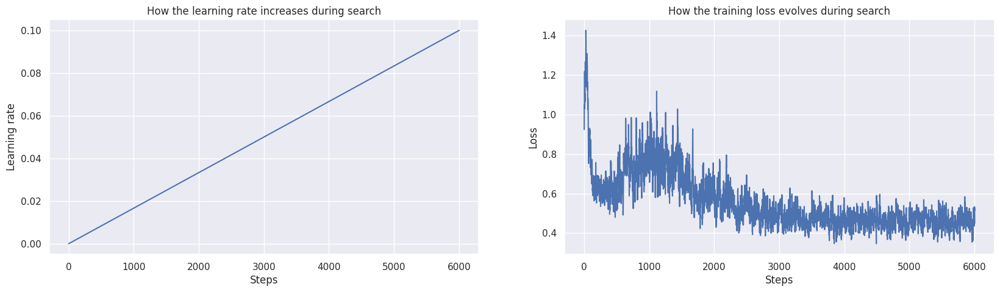

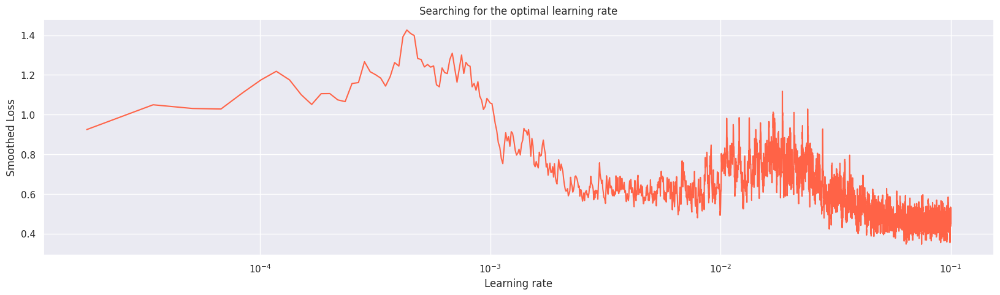

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(20, 5))

ax[0].plot(find_lr_df.lr.values)
ax[0].set_xlabel("Steps")
ax[0].set_ylabel("Learning rate")
ax[0].set_title("How the learning rate increases during search")

ax[1].plot(find_lr_df["smoothed loss"].values)
ax[1].set_xlabel("Steps")
ax[1].set_ylabel("Loss")
ax[1].set_title("How the training loss evolves during search")

plt.figure(figsize=(20, 5))
plt.plot(find_lr_df.lr.values, find_lr_df["smoothed loss"].values, '-', color="tomato")
plt.xlabel("Learning rate")
plt.xscale("log")
plt.ylabel("Smoothed Loss")
plt.title("Searching for the optimal learning rate")
plt.show()

In [ ]:
 start_lr = 1e-6
end_lr = 0.006

## Training the Model and Saving Checkpoints

Train the modified ResNet18 model for the desired number of epochs, then save the trained weights and loss logs for future analysis.

In [ ]:
MODEL_FILENAME = "breastcancer_model.pth"
MODEL_PATH = os.path.join("/kaggle/working", MODEL_FILENAME)

if run_training:
    NUM_EPOCHS = 30 # should keep 30 here
    optimizer = optim.SGD(model.fc.parameters(), lr=0.01)
    scheduler = get_scheduler(optimizer, start_lr, end_lr, 2 * NUM_EPOCHS)

    results = train_loop(model, criterion, optimizer, scheduler=scheduler, num_epochs=NUM_EPOCHS)
    model, loss_dict, running_loss_dict = results["model"], results["loss_dict"], results["running_loss_dict"]

    # Save model
    torch.save(model.state_dict(), MODEL_PATH)
    print(f"Model saved at {MODEL_PATH}")

    # Save losses
    losses_df = pd.DataFrame(loss_dict["train"], columns=["train"])
    losses_df["dev"] = loss_dict["dev"]
    losses_df["test"] = loss_dict["test"]
    losses_df.to_csv("/kaggle/working/losses_breastcancer.csv", index=False)

    running_losses_df = pd.DataFrame(running_loss_dict["train"], columns=["train"])
    running_losses_df.loc[0:len(running_loss_dict["dev"]) - 1, "dev"] = running_loss_dict["dev"]
    running_losses_df.loc[0:len(running_loss_dict["test"]) - 1, "test"] = running_loss_dict["test"]
    running_losses_df.to_csv("/kaggle/working/running_losses_breastcancer.csv", index=False)

else:
    # Load model from working directory
    if os.path.exists(MODEL_PATH):
        model.load_state_dict(torch.load(MODEL_PATH, map_location=device))
        model.eval()
        print(f"Model loaded from {MODEL_PATH}")
    else:
        print(f"No trained model found at {MODEL_PATH}, please set run_training=True to train it first.")

    # Load losses if available
    losses_file = "/kaggle/working/losses_breastcancer.csv"
    running_losses_file = "/kaggle/working/running_losses_breastcancer.csv"

    if os.path.exists(losses_file):
        losses_df = pd.read_csv(losses_file)
    else:
        losses_df = None
        print("No losses file found.")

    if os.path.exists(running_losses_file):
        running_losses_df = pd.read_csv(running_losses_file)
    else:
        running_losses_df = None
        print("No running losses file found.")

Epoch 0/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4795 Acc: 0.7862


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4532 Acc: 0.7891


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.4218 Acc: 0.8087

Epoch 1/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4693 Acc: 0.7911


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4217 Acc: 0.8222


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3932 Acc: 0.8387

Epoch 2/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4625 Acc: 0.7944


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4319 Acc: 0.8113


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3967 Acc: 0.8284

Epoch 3/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4594 Acc: 0.7973


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4180 Acc: 0.8153


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3898 Acc: 0.8327

Epoch 4/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4552 Acc: 0.7991


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4475 Acc: 0.7955


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.4141 Acc: 0.8164

Epoch 5/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4513 Acc: 0.8011


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4179 Acc: 0.8291


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3932 Acc: 0.8444

Epoch 6/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4501 Acc: 0.8020


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4043 Acc: 0.8295


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3707 Acc: 0.8455

Epoch 7/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4465 Acc: 0.8038


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4180 Acc: 0.8202


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3859 Acc: 0.8359

Epoch 8/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4440 Acc: 0.8051


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4277 Acc: 0.8203


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3966 Acc: 0.8373

Epoch 9/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4406 Acc: 0.8057


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4226 Acc: 0.8195


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3830 Acc: 0.8383

Epoch 10/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4390 Acc: 0.8065


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4234 Acc: 0.8266


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3885 Acc: 0.8428

Epoch 11/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4389 Acc: 0.8068


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4321 Acc: 0.8056


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3948 Acc: 0.8238

Epoch 12/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4379 Acc: 0.8082


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4270 Acc: 0.8157


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3924 Acc: 0.8330

Epoch 13/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4362 Acc: 0.8096


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4323 Acc: 0.8077


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3950 Acc: 0.8259

Epoch 14/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4345 Acc: 0.8107


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4390 Acc: 0.8060


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.4009 Acc: 0.8249

Epoch 15/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4351 Acc: 0.8085


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4250 Acc: 0.8118


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3876 Acc: 0.8301

Epoch 16/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4344 Acc: 0.8104


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4245 Acc: 0.8157


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3897 Acc: 0.8335

Epoch 17/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4329 Acc: 0.8107


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4351 Acc: 0.8002


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3983 Acc: 0.8213

Epoch 18/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4303 Acc: 0.8117


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4185 Acc: 0.8144


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3818 Acc: 0.8319

Epoch 19/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4325 Acc: 0.8107


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4318 Acc: 0.8071


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3933 Acc: 0.8259

Epoch 20/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4321 Acc: 0.8119


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4162 Acc: 0.8235


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3871 Acc: 0.8407

Epoch 21/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4298 Acc: 0.8114


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4274 Acc: 0.8072


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3958 Acc: 0.8268

Epoch 22/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4297 Acc: 0.8129


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4198 Acc: 0.8208


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3860 Acc: 0.8381

Epoch 23/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4297 Acc: 0.8127


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4352 Acc: 0.8017


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3984 Acc: 0.8227

Epoch 24/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4277 Acc: 0.8131


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4357 Acc: 0.8055


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3983 Acc: 0.8276

Epoch 25/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4267 Acc: 0.8133


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4220 Acc: 0.8194


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3854 Acc: 0.8345

Epoch 26/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4263 Acc: 0.8140


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4229 Acc: 0.8179


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3904 Acc: 0.8368

Epoch 27/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4273 Acc: 0.8134


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4240 Acc: 0.8096


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3893 Acc: 0.8296

Epoch 28/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4261 Acc: 0.8142


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4635 Acc: 0.7984


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.4106 Acc: 0.8196

Epoch 29/29
----------


  0%|          | 0/6005 [00:00<?, ?it/s]

train Loss: 0.4263 Acc: 0.8130


  0%|          | 0/1267 [00:00<?, ?it/s]

dev Loss: 0.4140 Acc: 0.8274


  0%|          | 0/1400 [00:00<?, ?it/s]

test Loss: 0.3864 Acc: 0.8447

Training complete in 173m 20s
Best val Acc: 0.8295
Model saved at /kaggle/working/breastcancer_model.pth


## Plotting Loss Curves and Convergence

Visualize loss curves for train, validation, and test sets across epochs, as well as step-wise training loss progression.

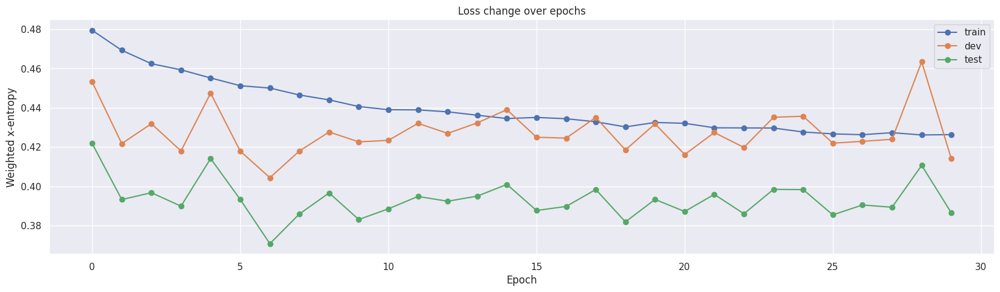

In [ ]:
plt.figure(figsize=(20, 5))

plt.plot(losses_df["train"], '-o', label="train")
plt.plot(losses_df["dev"], '-o', label="dev")
plt.plot(losses_df["test"], '-o', label="test")

plt.xlabel("Epoch")
plt.ylabel("Weighted x-entropy")
plt.title("Loss change over epochs")
plt.legend()
plt.grid(True)
plt.show()

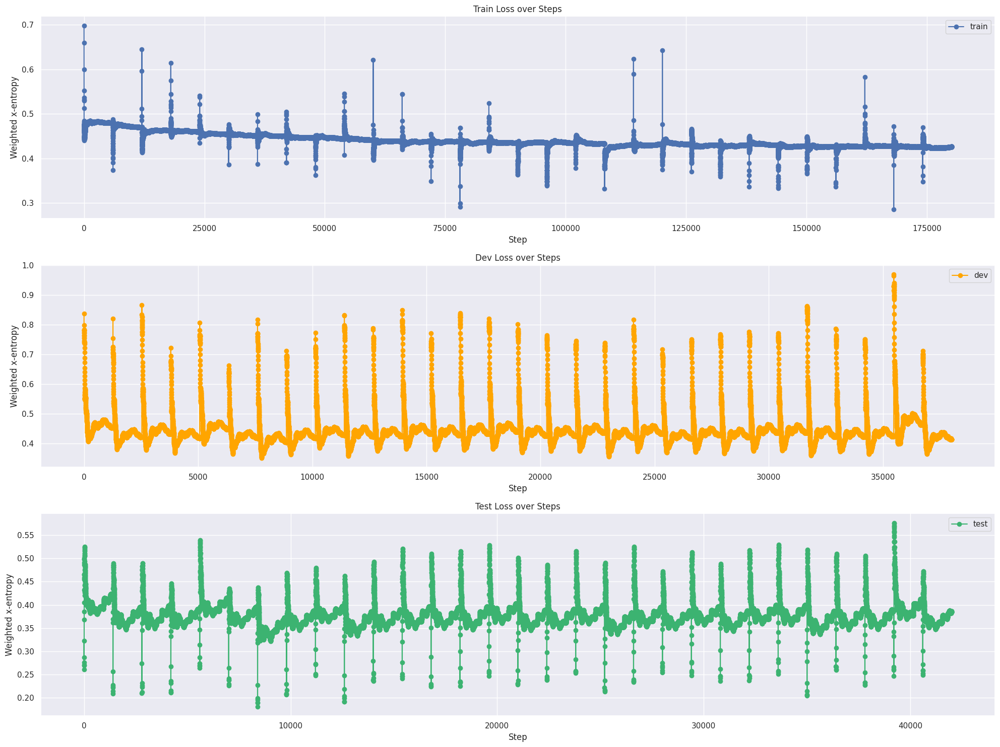

In [ ]:
fig, ax = plt.subplots(3, 1, figsize=(20, 15))

ax[0].plot(running_losses_df["train"], '-o', label="train")
ax[0].set_xlabel("Step")
ax[0].set_ylabel("Weighted x-entropy")
ax[0].set_title("Train Loss over Steps")
ax[0].legend()
ax[0].grid(True)

ax[1].plot(running_losses_df["dev"], '-o', label="dev", color="orange")
ax[1].set_xlabel("Step")
ax[1].set_ylabel("Weighted x-entropy")
ax[1].set_title("Dev Loss over Steps")
ax[1].legend()
ax[1].grid(True)

ax[2].plot(running_losses_df["test"], '-o', label="test", color="mediumseagreen")
ax[2].set_xlabel("Step")
ax[2].set_ylabel("Weighted x-entropy")
ax[2].set_title("Test Loss over Steps")
ax[2].legend()
ax[2].grid(True)

plt.tight_layout()
plt.show()

##  Evaluating Model Predictions on Development and Test Sets

Run inference on dev and test sets, collect per-patch predictions, and generate probability scores for IDC detection.

In [ ]:
# --- Evaluate model function ---
def evaluate_model(model, dataloader, device="cuda"):
    model.to(device)
    model.eval()
    predictions = []

    with torch.no_grad():
        for data in dataloader:
            # Move inputs and labels to device
            images = data["image"].to(device)
            labels = data["label"].to(device)

            # Forward pass
            proba = model(images)
            preds = proba.argmax(dim=1)

            for j in range(len(preds)):
                predictions.append({
                    "true": int(labels[j].cpu()),
                    "predicted": int(preds[j].cpu()),
                    "proba": float(proba[j, 1].cpu()),
                    "x": int(data["x"][j]),
                    "y": int(data["y"][j]),
                    "patient_id": str(data["patient_id"][j])
                })
    return predictions

In [ ]:
write_path = "/kaggle/working"
LOSSES_PATH = "/kaggle/working"

In [ ]:
if run_training:
    dev_predictions_list = evaluate_model(model, dev_dataloader, device="cuda")
    test_predictions_list = evaluate_model(model, test_dataloader, device="cuda")

    dev_predictions = pd.DataFrame(dev_predictions_list)
    test_predictions = pd.DataFrame(test_predictions_list)

    dev_predictions.to_csv(write_path + "dev_predictions.csv", index=False)
    test_predictions.to_csv(write_path + "test_predictions.csv", index=False)

else:
    dev_predictions = pd.read_csv(LOSSES_PATH + "dev_predictions.csv")
    test_predictions = pd.read_csv(LOSSES_PATH + "test_predictions.csv")

    dev_predictions = dev_predictions.dropna(subset=["patient_id"])
    dev_predictions["patient_id"] = dev_predictions["patient_id"].astype(str)

    test_predictions = test_predictions.dropna(subset=["patient_id"])
    test_predictions["patient_id"] = test_predictions["patient_id"].astype(str)

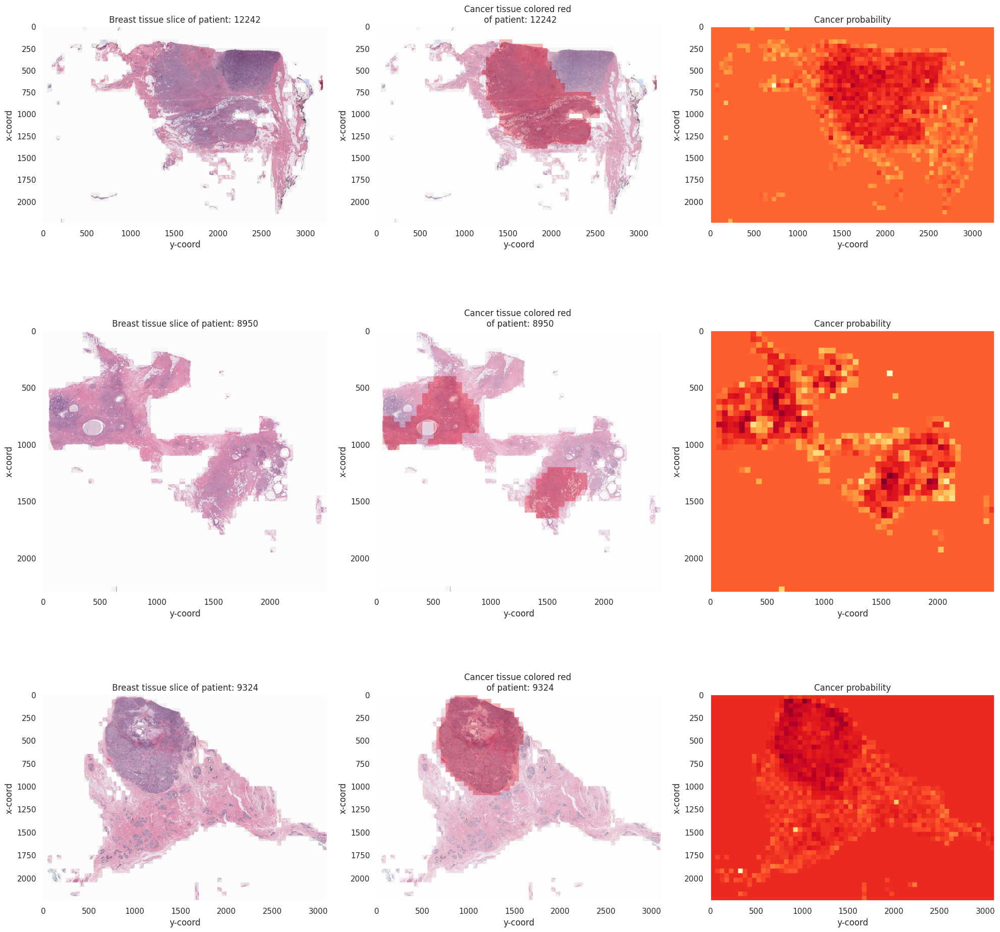

In [ ]:
# Clean patient IDs first
dev_predictions = dev_predictions.dropna(subset=["patient_id"])
dev_predictions["patient_id"] = dev_predictions["patient_id"].astype(str)

fig, ax = plt.subplots(3, 3, figsize=(20, 20))

for n in range(3):
    patient_id = dev_predictions.patient_id.unique()[n]  # safe name
    grid, mask, broken_patches, mask_proba = visualise_breast_tissue(patient_id, pred_df=dev_predictions)

    ax[n, 0].imshow(grid, alpha=0.9)
    ax[n, 1].imshow(mask, alpha=0.8)
    ax[n, 1].imshow(grid, alpha=0.7)
    ax[n, 2].imshow(mask_proba[:, :, 0], cmap="YlOrRd")

    for m in range(3):
        ax[n, m].set_xlabel("y-coord")
        ax[n, m].set_ylabel("x-coord")
        ax[n, m].grid(False)

    ax[n, 0].set_title(f"Breast tissue slice of patient: {patient_id}")
    ax[n, 1].set_title(f"Cancer tissue colored red \n of patient: {patient_id}")
    ax[n, 2].set_title("Cancer probability")

plt.tight_layout()
plt.show()

## Visualizing Prediction Distributions and Errors

Plot histograms of prediction probabilities, visualize tissue-level probability heatmaps, and prepare confusion matrices to analyze errors.


In [ ]:
dev_predictions.head()

,true,predicted,proba,x,y,patient_id
0,0,1,0.486406,1051,451,12242
1,0,0,-1.743711,201,501,12242
2,0,0,-1.053085,151,351,12242
3,0,0,-2.948717,2301,1451,12242
4,0,1,2.090842,2101,601,12242


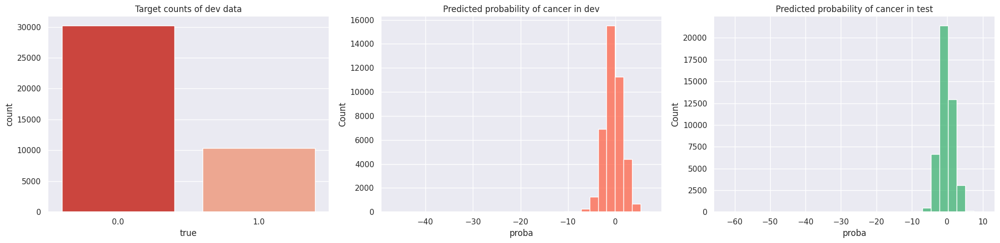

In [ ]:
fig, ax = plt.subplots(1, 3, figsize=(20, 5))

# Target counts of dev data
sns.countplot(x=dev_predictions.true.astype(float), ax=ax[0], palette="Reds_r")
ax[0].set_title("Target counts of dev data")

# Predicted probability of cancer in dev
sns.histplot(dev_predictions.proba.astype(float), bins=30, ax=ax[1], color="tomato")
ax[1].set_title("Predicted probability of cancer in dev")

# Predicted probability of cancer in test
sns.histplot(test_predictions.proba.astype(float), bins=30, ax=ax[2], color="mediumseagreen")
ax[2].set_title("Predicted probability of cancer in test")

plt.tight_layout()

plt.show()

In [ ]:
def get_confusion_matrix(y_true, y_pred):
    transdict = {1: "cancer", 0: "no cancer"}

    # Map numeric to string labels
    y_t = np.array([transdict[x] for x in y_true])
    y_p = np.array([transdict[x] for x in y_pred])

    labels = ["no cancer", "cancer"]
    index_labels = ["actual no cancer", "actual cancer"]
    col_labels = ["predicted no cancer", "predicted cancer"]

    # Compute confusion matrix
    confusion = confusion_matrix(y_t, y_p, labels=labels)
    confusion_df = pd.DataFrame(confusion, index=index_labels, columns=col_labels)

    # Normalize by row
    for n in range(2):
        confusion_df.iloc[n] = confusion_df.iloc[n] / confusion_df.sum(axis=1).iloc[n]

    return confusion_df

In [ ]:
# Convert predictions to a NumPy array for easier use
dev_true_np = dev_predictions.true.values
dev_predicted_np = dev_predictions.predicted.values

test_true_np = test_predictions.true.values
test_predicted_np = test_predictions.predicted.values

# Calculate confusion matrices
dev_cm = confusion_matrix(dev_true_np, dev_predicted_np)
test_cm = confusion_matrix(test_true_np, test_predicted_np)

# Print the confusion matrices
print("Development set Confusion Matrix:")
print(dev_cm)
print("\nTest set Confusion Matrix:")
print(test_cm)

# Calculate metrics for the dev set
dev_accuracy = accuracy_score(dev_true_np, dev_predicted_np)
dev_precision = precision_score(dev_true_np, dev_predicted_np)
dev_recall = recall_score(dev_true_np, dev_predicted_np)

# Convert to tensors for f1_score calculation
dev_true_ts = torch.from_numpy(dev_true_np)
dev_predicted_ts = torch.from_numpy(dev_predicted_np)

dev_f1 = f1_score(dev_predicted_ts, dev_true_ts)

# Calculate metrics for the test set
test_accuracy = accuracy_score(test_true_np, test_predicted_np)
test_precision = precision_score(test_true_np, test_predicted_np)
test_recall = recall_score(test_true_np, test_predicted_np)

# Convert to tensors for f1_score calculation
test_true_ts = torch.from_numpy(test_true_np)
test_predicted_ts = torch.from_numpy(test_predicted_np)
test_f1 = f1_score(test_predicted_ts, test_true_ts)

# Display the metrics
print("\n--- Development Set Metrics ---")
print(f"Accuracy: {dev_accuracy:.4f}")
print(f"Precision: {dev_precision:.4f}")
print(f"Recall: {dev_recall:.4f}")
print(f"F1-Score: {dev_f1:.4f}")

print("\n--- Test Set Metrics ---")
print(f"Accuracy: {test_accuracy:.4f}")
print(f"Precision: {test_precision:.4f}")
print(f"Recall: {test_recall:.4f}")
print(f"F1-Score: {test_f1:.4f}")

Development set Confusion Matrix:
[[26270  3951]
 [ 2937  7386]]

Test set Confusion Matrix:
[[27396  3467]
 [ 3454 10472]]

--- Development Set Metrics ---
Accuracy: 0.8301
Precision: 0.6515
Recall: 0.7155
F1-Score: 0.6820

--- Test Set Metrics ---
Accuracy: 0.8455
Precision: 0.7513
Recall: 0.7520
F1-Score: 0.7516
